# **1. Introducción**

explicacion de dicho capítulo y del propio fichero junto con contenidos.

## **1.1. Contexto del problema**

explicación del problema de predecir las acciones para sistemas ADAS (incluir alguna ref maybe?) y el principal objetivo genérico de la práctica.

## **1.2. Objetivos de la práctica**

Indicar a través del main objetivo el resto de scopes de la práctica, añadiendo subobjetivos de los componentes de la misma.

## **1.3. Estructura de los ficheros**

Indicar la estructura de los directorios de forma sencilla y poco profunda. (ya dentro de cada apartado se explicará más en profundidad el uso de cada uno de los ficheros si es necesario (ej: img/ no es necesario))

# **2. Estado del Arte**

Indicar herramientas, lenguajes, papers, artículos que se van a utilizar durante la práctica. (Muy escueto no TFG dos líneas y demasiado ya) [subsection por cada una]

# **3. Importaciones y Funciones Auxiliares**

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler

In [2]:
# Análisis exploratorio con gráficas
def plot_time_series(df, time_col, value_cols, marker_col, driver, action):
    colors = ['b', 'g', 'm']  # Colores diferentes para cada línea
    fig, axes = plt.subplots(1, len(value_cols), figsize=(18, 6), sharex=True)
    
    for i, col in enumerate(value_cols):
        axes[i].plot(df[time_col], df[col], label=col, color=colors[i])
        
        # Resaltar cuando esté realizando la acción
        highlighted = df[df[marker_col] == 1]
        axes[i].scatter(highlighted[time_col], highlighted[col], color='r', label='Maniobra activa', s=10)
        
        axes[i].set_xlabel('Tiempo')
        axes[i].set_ylabel(col)
        axes[i].set_title(f'Evolución temporal de {col}')
        axes[i].legend()
    
    plt.tight_layout()
    plt.savefig(f'img/Driver{driver}/EDA/evolution_temp_{action}.png')
    plt.show()

    # Matriz de correlación
    plt.figure(figsize=(10, 6))
    sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Matriz de correlación')
    plt.savefig(f'img/Driver{driver}/EDA/matrix_corr_{action}.png')
    plt.show()

# **4. Preprocesamiento de los Datos**

Indicar el objetivo de este preprocesamiento previo (exceso de columnas, datos innecesarios, transformación de los mismos (lógica difusa), etc.). Indicar el uso de paper del primer paper como principal seguimiento del preprocesamiento, al igual del uso de otros materiales o ampliación de dichas técnicas.

## **4.1. Lectura de Datos**

Para la lectura de los datos, primero de todo es necesario el paso de los datos de un fichero *xlsx* a un fichero *csv*, permitiendo una mejor manipulación y estudio de los propios de datos con las herramientas que ofrece Python. Para ello, se ha creado un script de Python localizado en [`data/excel_to_csv.py`](data/excel_to_csv.py), el cual permite obtener los datos de la primera hoja del fichero *xlsx* y transformarlos al formato *csv* con el uso del carácter ',' para la separación de los datos. A su vez, se halla también el fichero [`data/transform.sh`](data/transform.sh), el cual permite transformar todos los ficheros *xlsx* de los 5 conductores de cada una de las maniobras a analizar.

In [3]:
%%bash
./data/transform.sh

Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.
Archivo CSV guardado con éxito.


Una vez pasado los ficheros *xlsx* a *csv*, es necesario analizar los datos de tal forma que permita hacer una limpieza de datos nulos o duplicados, al igual de identificar aquellos datos no útiles como de la transformación de los mismos a un sistema clasificatorio o una normalización de los mismos. Para ello, a modo de ejemplo se mostrará el uso del fichero [`./data/Driver1/STISIMData_Overtaking.csv`](./data/Driver1/STISIMData_Overtaking.csv) para el preprocesamiento de los datos.

In [4]:
# Carga de datos desde csv
def load_data(path):
    df = pd.read_csv(path)
    return df

In [5]:
df = load_data('./data/Driver1/STISIMData_Overtaking.csv')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5952 entries, 0 to 5951
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Elapsed time          5952 non-null   float64
 1   Long Dist             5952 non-null   float64
 2   Lat Pos               5952 non-null   float64
 3   Steering wheel angle  5952 non-null   float64
 4   Throttle input        5952 non-null   float64
 5   Brake pedal force     5952 non-null   float64
 6   Gas pedal             5952 non-null   int64  
 7   Brake pedal           5952 non-null   int64  
 8   Clutch pedal          5952 non-null   int64  
 9   Left turn             5952 non-null   int64  
 10  Right turn            5952 non-null   int64  
 11  Gear                  5952 non-null   int64  
 12  speed                 5952 non-null   float64
 13  RPM                   5952 non-null   float64
 14  Hand wheel torque     5952 non-null   float64
 15  Maneuver marker flag 

In [6]:
df.head()

,Elapsed time,Long Dist,Lat Pos,Steering wheel angle,Throttle input,Brake pedal force,Gas pedal,Brake pedal,Clutch pedal,Left turn,...,RPM,Hand wheel torque,Maneuver marker flag,Accidents,Collisions,Peds Hit,Speeding Tics,Red Lgt Tics,Speed Exceed,Stop Sign Ticks
0,0.111,0.00,6.17,-6.18,0.0,1.36,0,0,10601,0,...,124.216,-0.07,0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
1,0.161,0.00,6.17,-6.18,0.0,1.36,0,0,10601,0,...,162.215,0.00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.213,0.01,6.17,-6.18,0.0,1.36,0,0,10601,0,...,198.359,0.00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.265,0.01,6.17,-6.18,0.0,1.36,0,0,10601,0,...,232.738,0.00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.316,0.01,6.17,-6.18,0.0,1.36,0,0,10601,0,...,265.438,0.00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Como se puede observar, hay un total de 7 columnas con demasiados valores nulos, incluyendo que los datos del giro a la derecha e izquierda, se encuentran incompletos, por lo que para el preprocesado, es necesario, no solo la eliminación de filas duplicadas, sino la eliminación de dichas columnas que no aportan información relevante para la construcción de un modelo de predicción.

In [7]:
# Eliminación de columnas con valores NA en un 99%
def drop_na_columns(df, threshold=0.99):
    missing_ratio = df.isnull().sum() / len(df)
    columns_to_drop = missing_ratio[missing_ratio > threshold].index
    df = df.drop(columns=columns_to_drop)

    # Se eliminan también las columnas Right & Left turn
    df = df.drop(columns=['Right turn', 'Left turn'])
    return df

In [8]:
df = drop_na_columns(df)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5952 entries, 0 to 5951
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Elapsed time          5952 non-null   float64
 1   Long Dist             5952 non-null   float64
 2   Lat Pos               5952 non-null   float64
 3   Steering wheel angle  5952 non-null   float64
 4   Throttle input        5952 non-null   float64
 5   Brake pedal force     5952 non-null   float64
 6   Gas pedal             5952 non-null   int64  
 7   Brake pedal           5952 non-null   int64  
 8   Clutch pedal          5952 non-null   int64  
 9   Gear                  5952 non-null   int64  
 10  speed                 5952 non-null   float64
 11  RPM                   5952 non-null   float64
 12  Hand wheel torque     5952 non-null   float64
 13  Maneuver marker flag  5952 non-null   int64  
dtypes: float64(9), int64(5)
memory usage: 651.1 KB


Después de esta la supresión de dichas columnas, quedan un total de 14 columnas de datos, indicando la primera `Elapsed Time` el momento de obtención de los datos de dicha fila, la última `Maneuver marker flag` indica si se está realizando dicha acción con un valor numérico de 1 o de 0 en caso de no estar realizándose, y las otras 12 columnas de datos indican atributos sobre el estado y entorno del vehículo.

In [9]:
# Preprocesamiento de los datos
def preprocess_data(path):
    df = load_data(path)
    df = drop_na_columns(df)
    return df

# **5. Análisis de Datos (EDA)**

## **5.1. Acción: 3step-Turnings**

Driver1


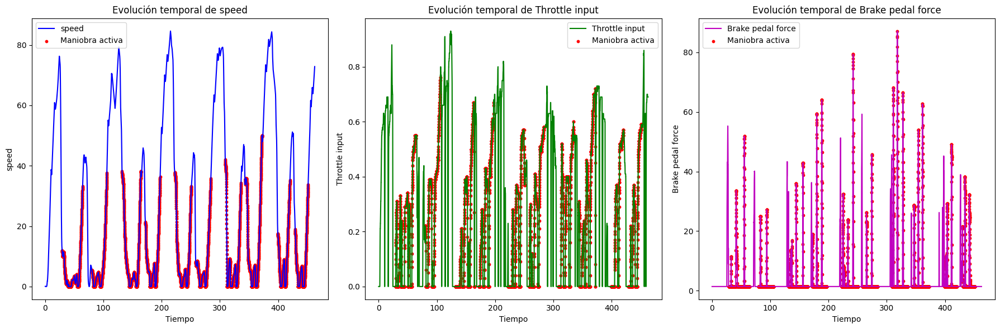

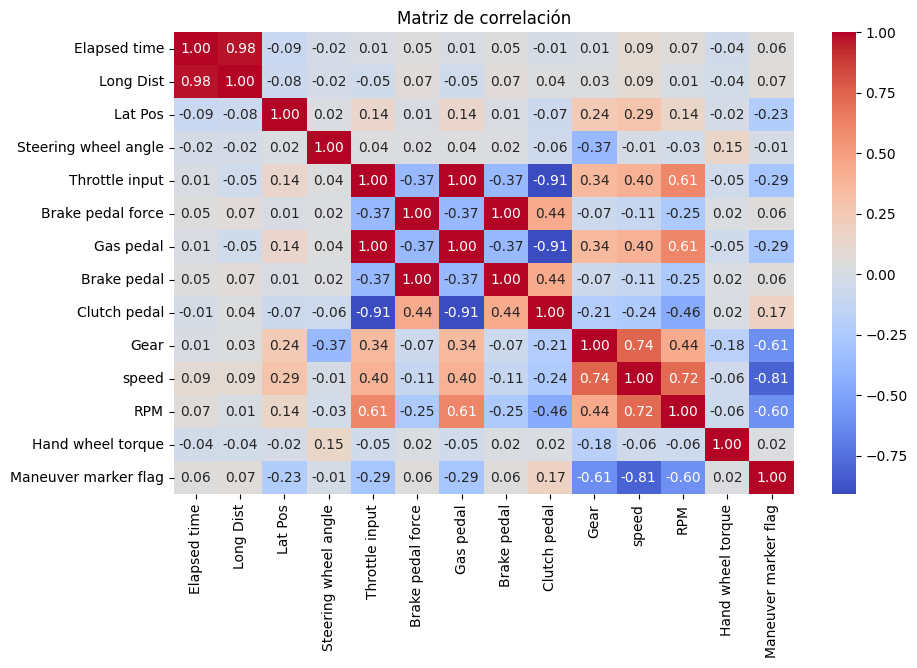

Driver2


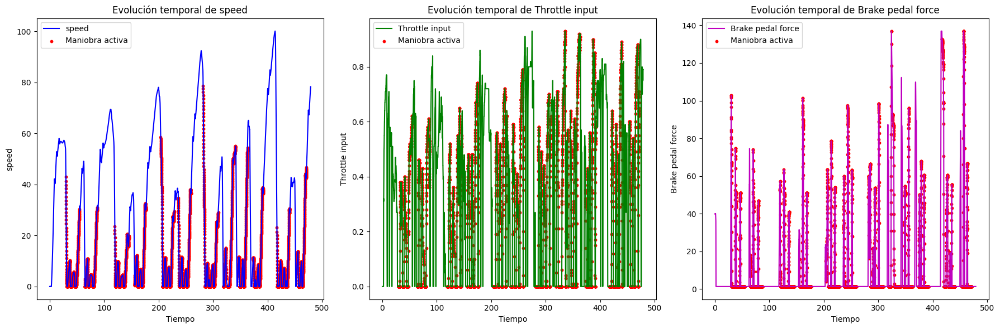

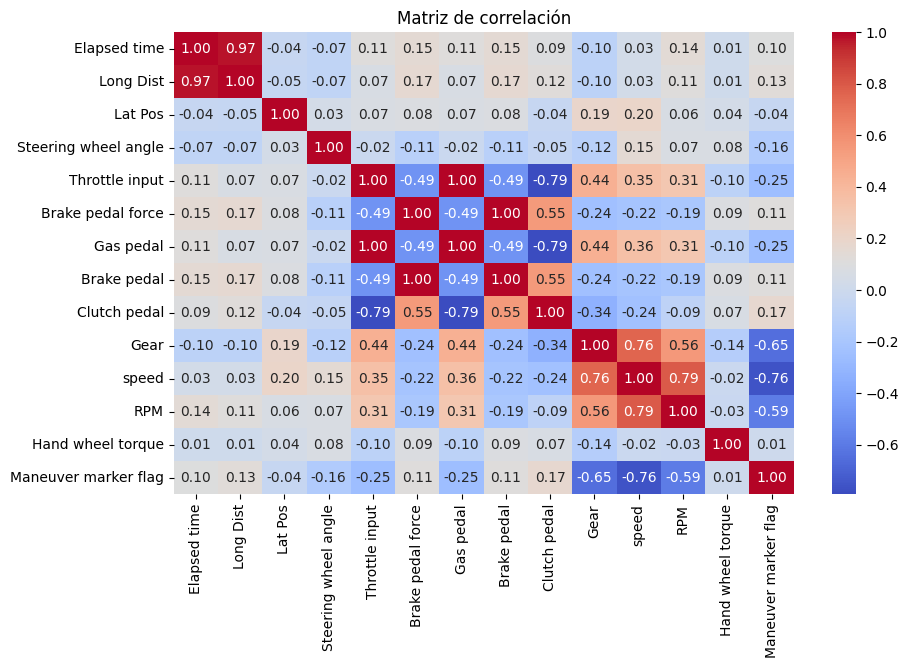

Driver3


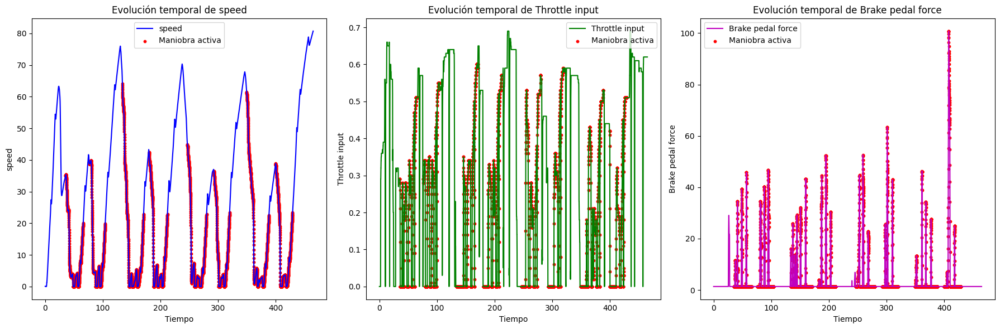

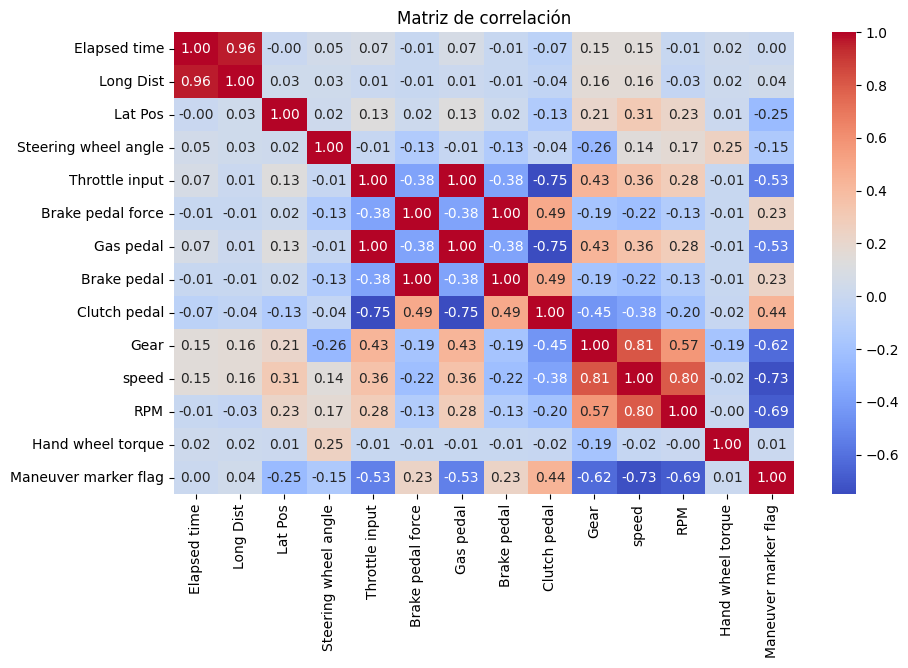

Driver4


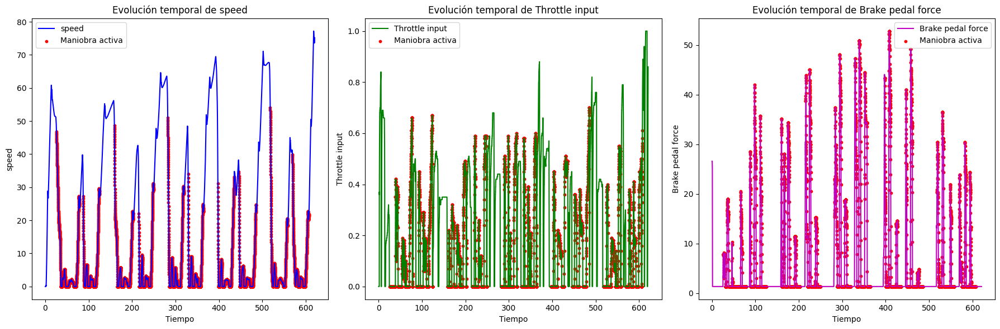

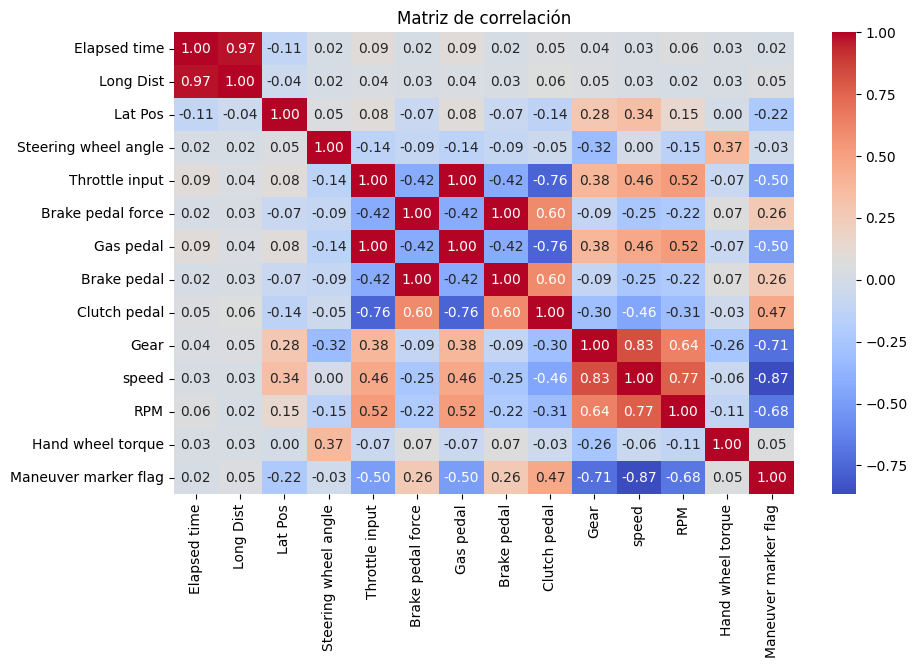

Driver5


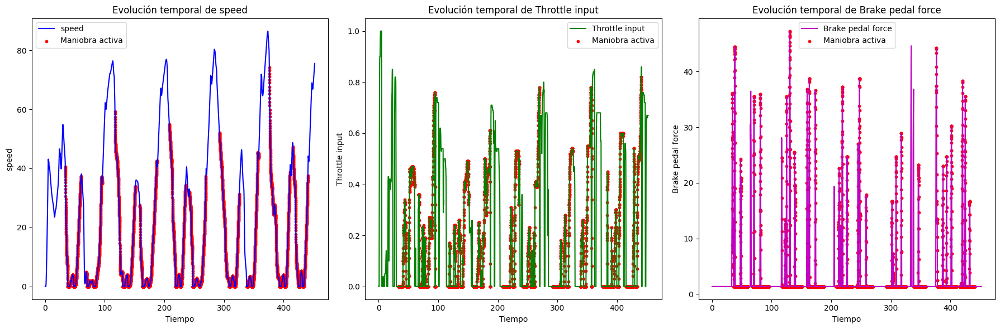

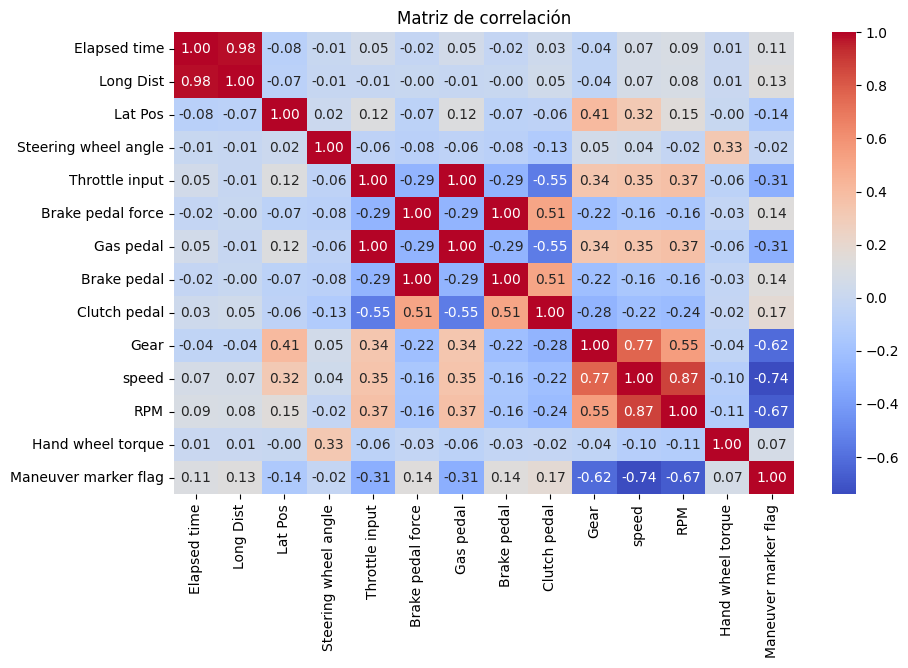

In [10]:
action = '3step-Turnings'

for i in range(1, 6):
    print(f'==========\nDriver{i}\n==========')
    path = f'./data/Driver{i}/STISIMData_{action}.csv'
    df = preprocess_data(path)
    
    # Seleccionar columnas relevantes para análisis temporal
    time_col = 'Elapsed time'
    value_cols = ['speed', 'Throttle input', 'Brake pedal force']
    marker_col = 'Maneuver marker flag'
    
    plot_time_series(df, time_col, value_cols, marker_col, i, action)

## **5.2. Acción: Overtaking**

Driver1


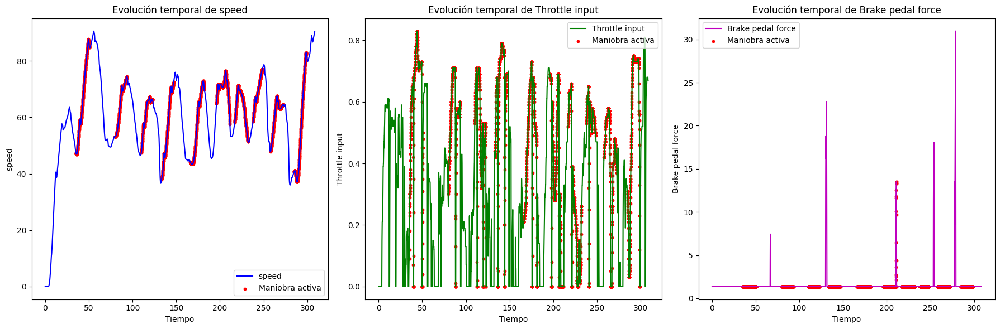

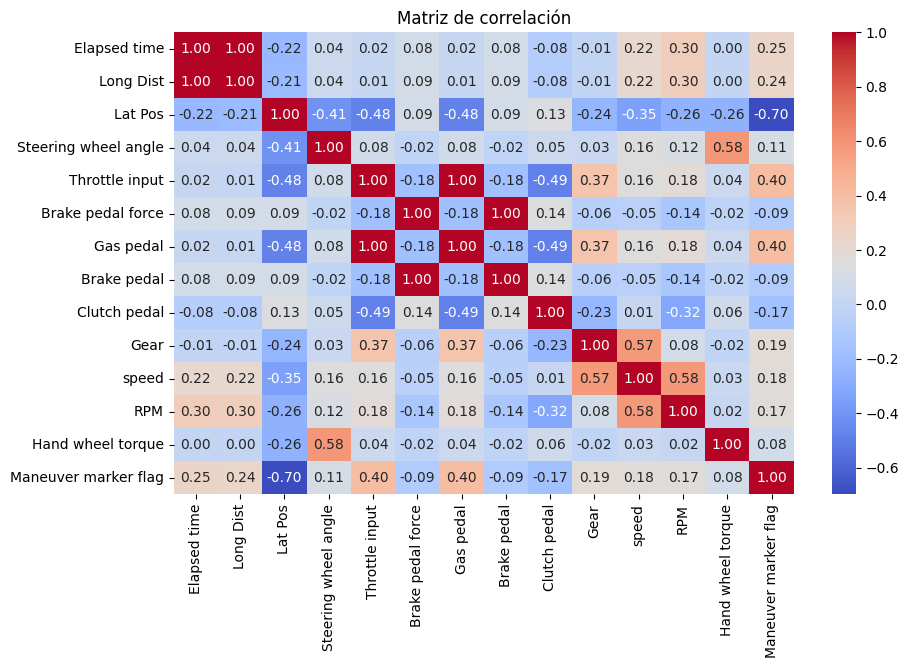

Driver2


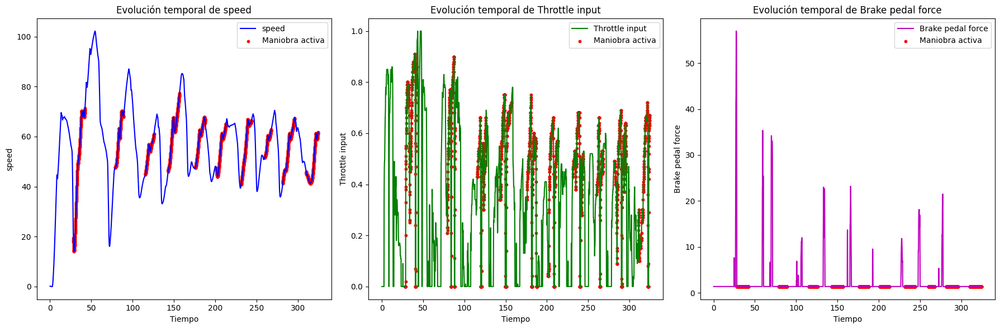

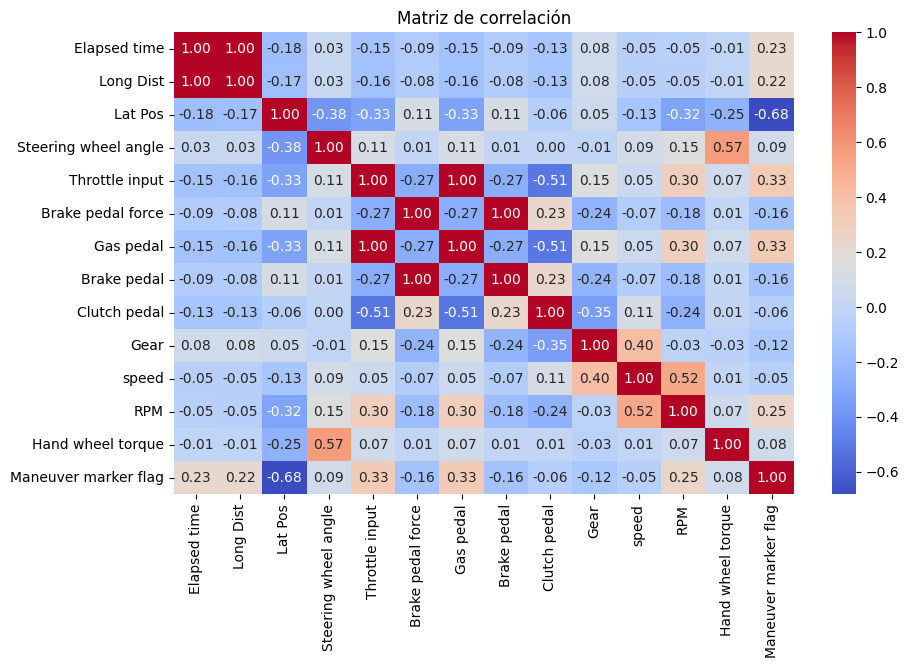

Driver3


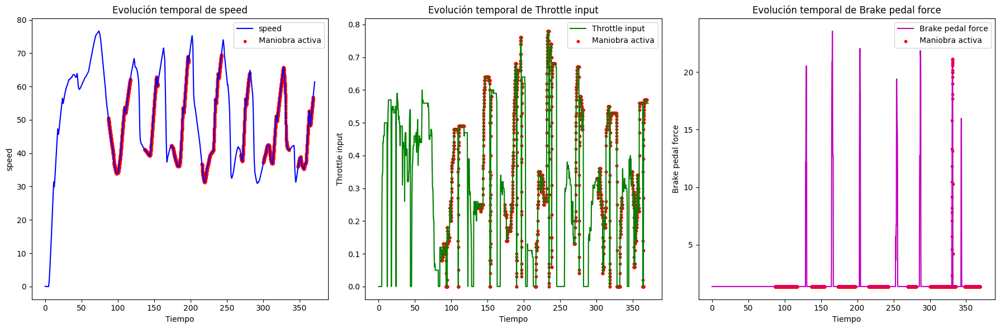

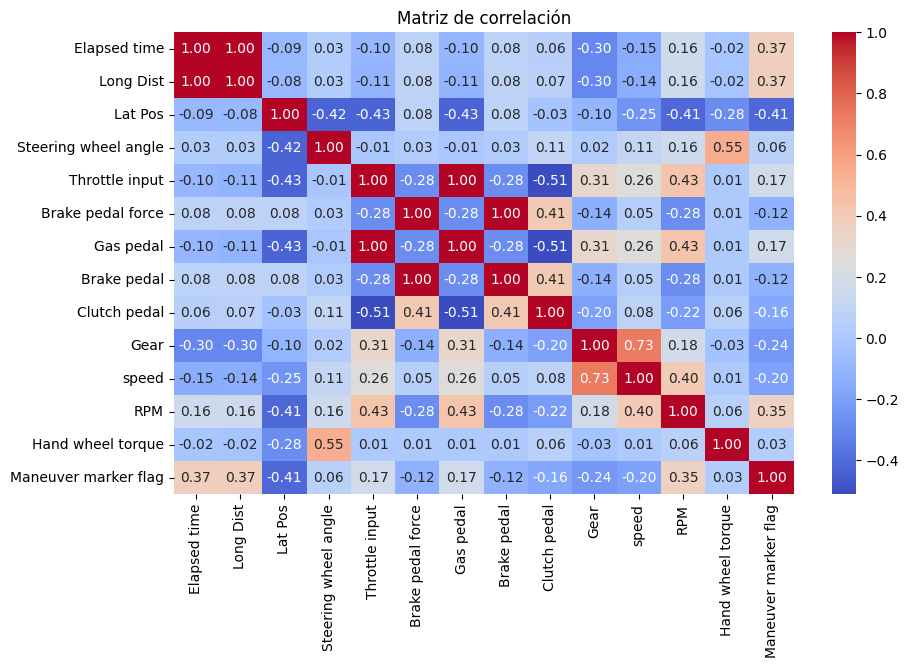

Driver4


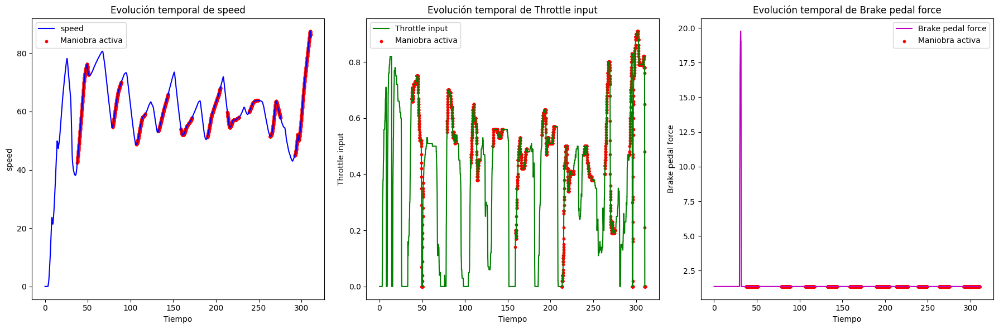

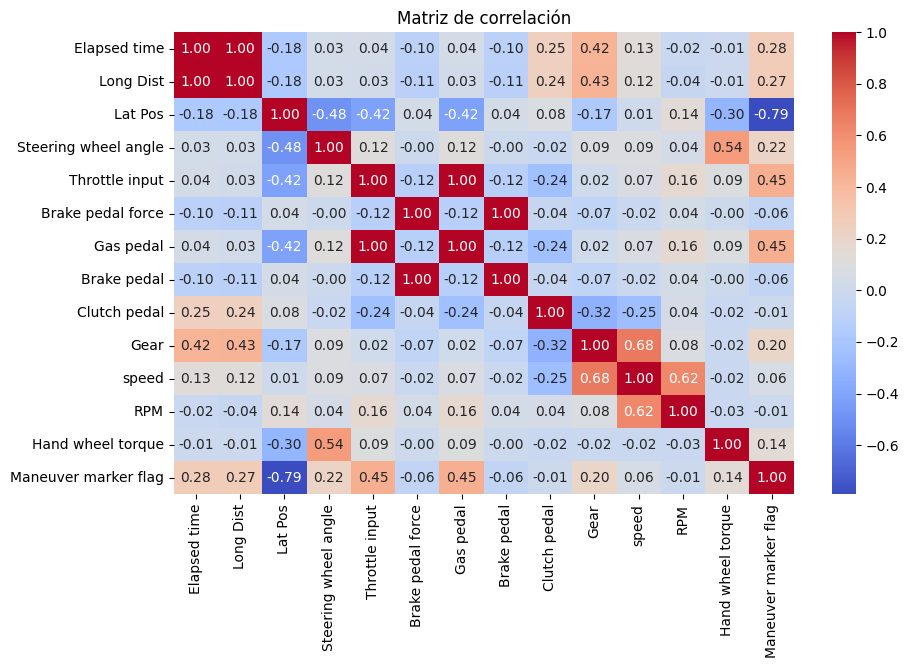

Driver5


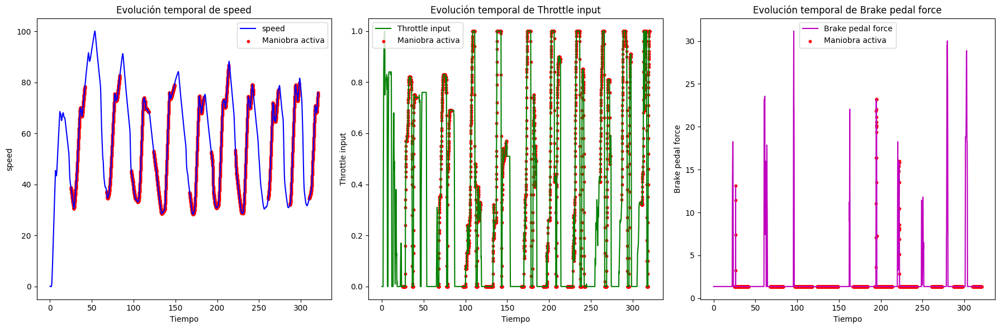

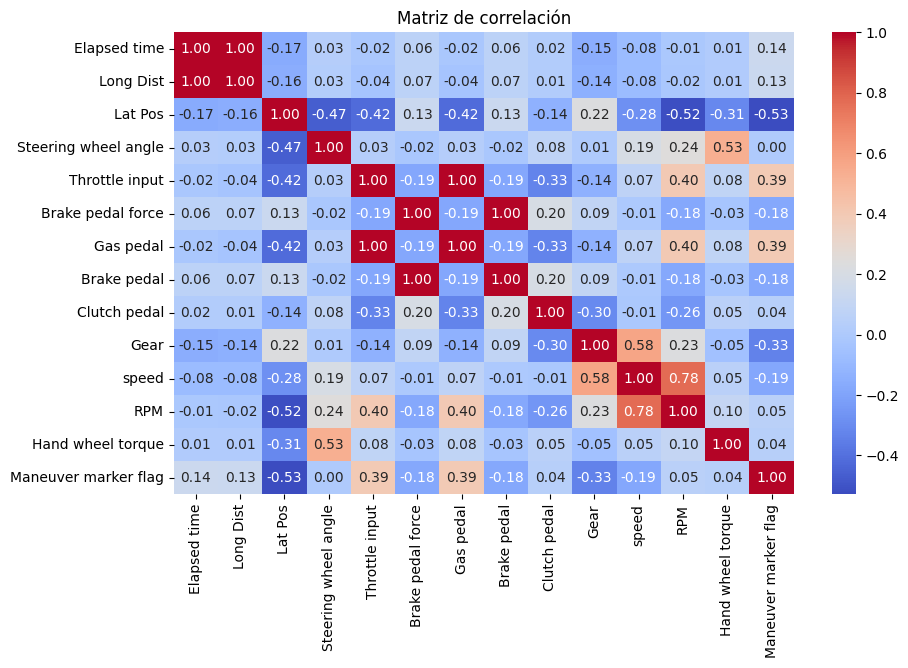

In [11]:
action = 'Overtaking'

for i in range(1, 6):
    print(f'==========\nDriver{i}\n==========')
    path = f'./data/Driver{i}/STISIMData_{action}.csv'
    df = preprocess_data(path)
    
    # Seleccionar columnas relevantes para análisis temporal
    time_col = 'Elapsed time'
    value_cols = ['speed', 'Throttle input', 'Brake pedal force']
    marker_col = 'Maneuver marker flag'
    
    plot_time_series(df, time_col, value_cols, marker_col, i, action)

## **5.3. Acción: Stopping**

Driver1


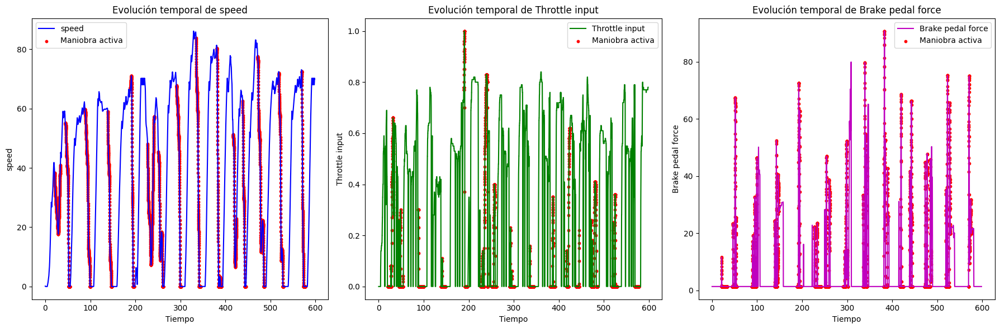

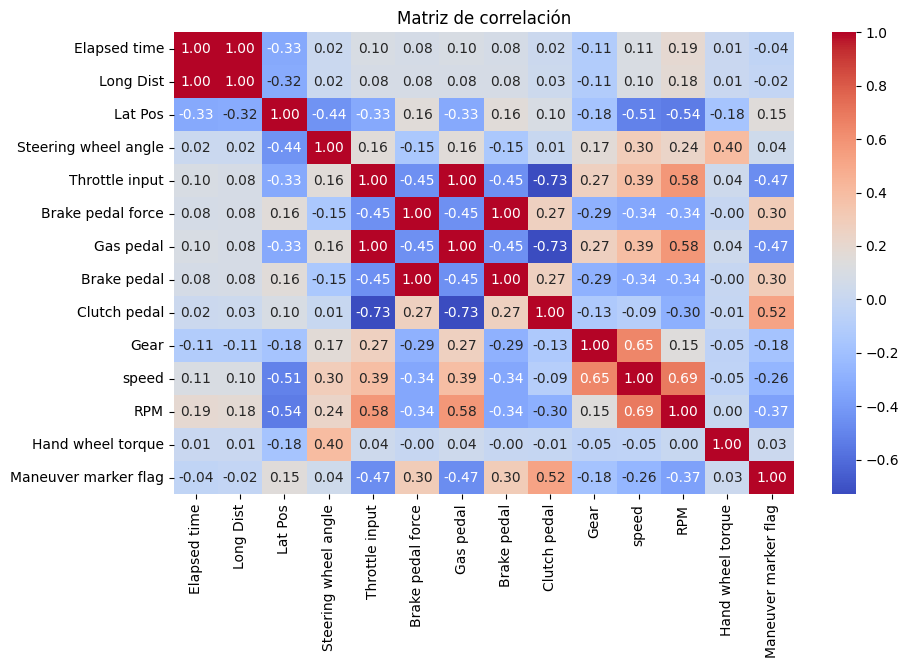

Driver2


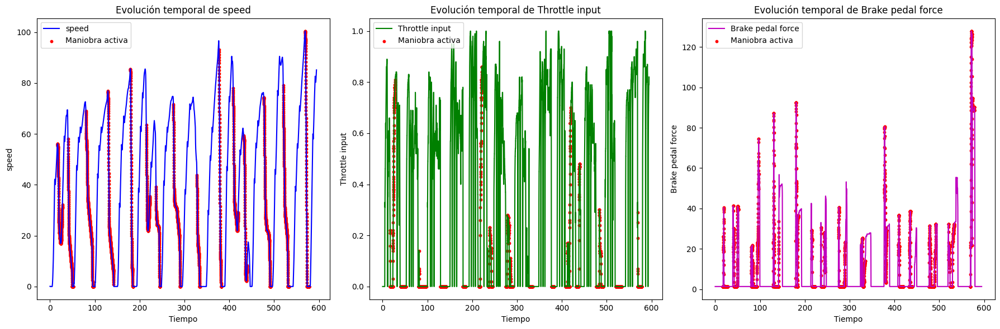

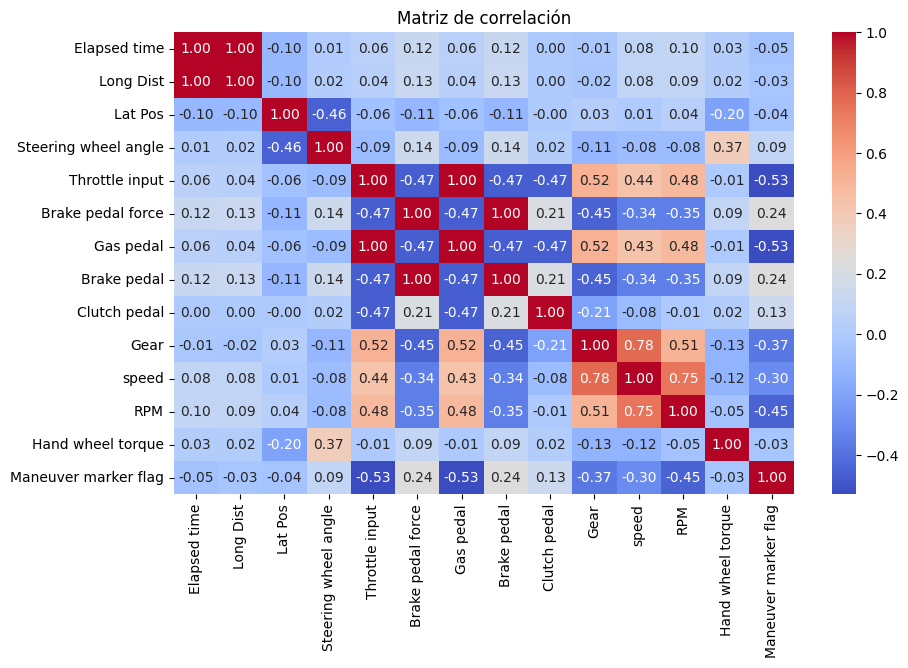

Driver3


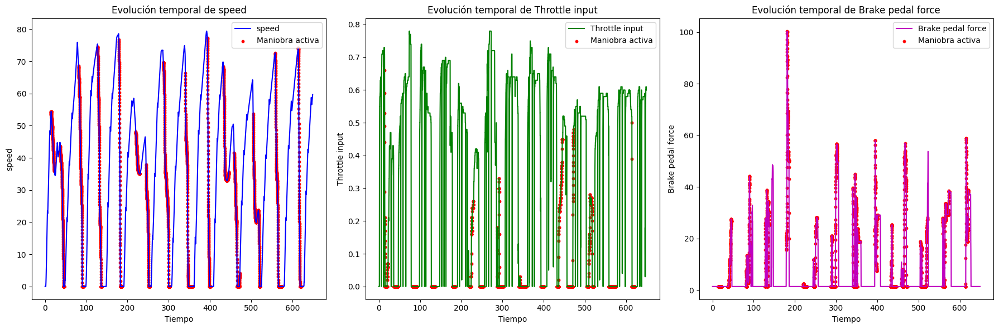

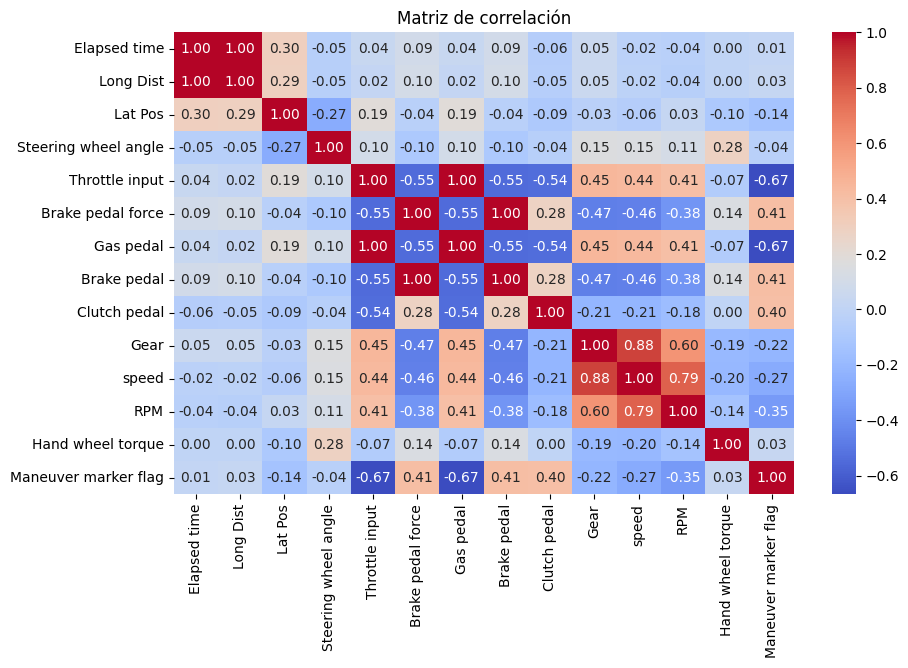

Driver4


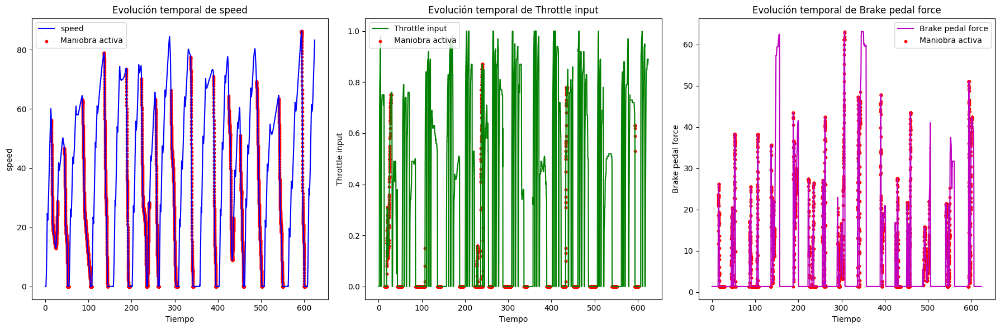

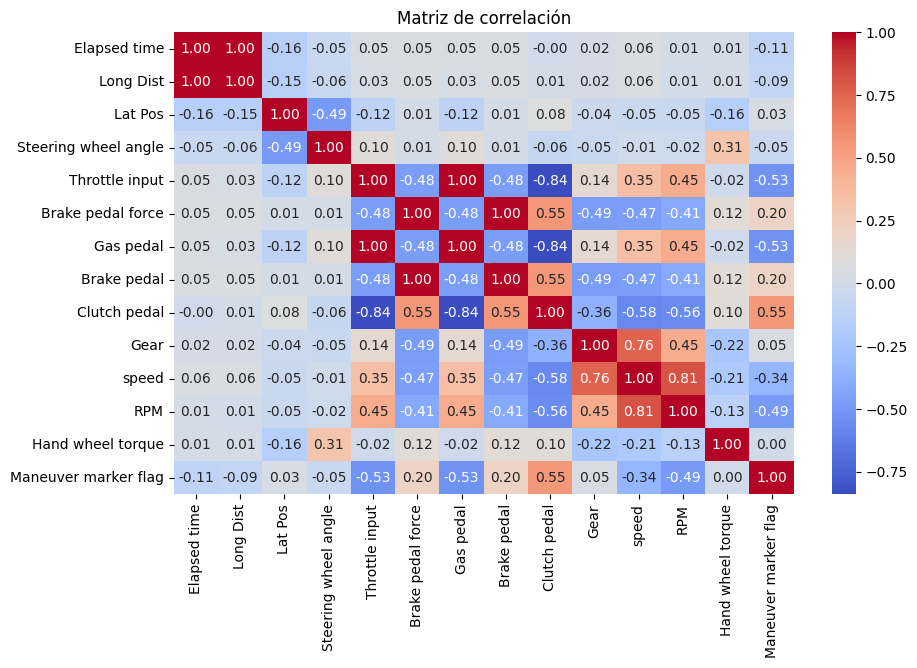

Driver5


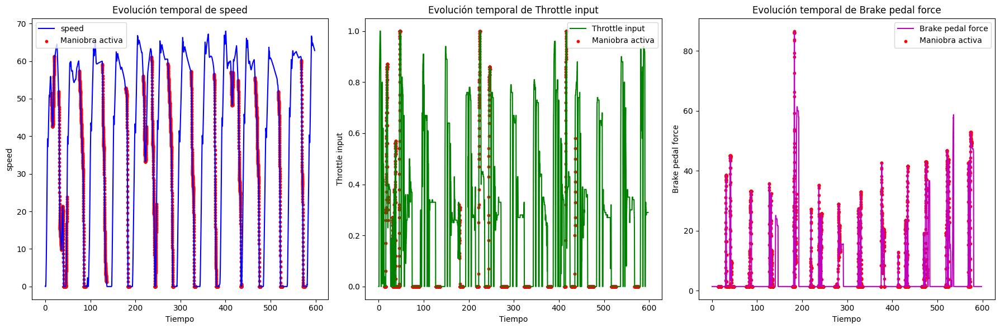

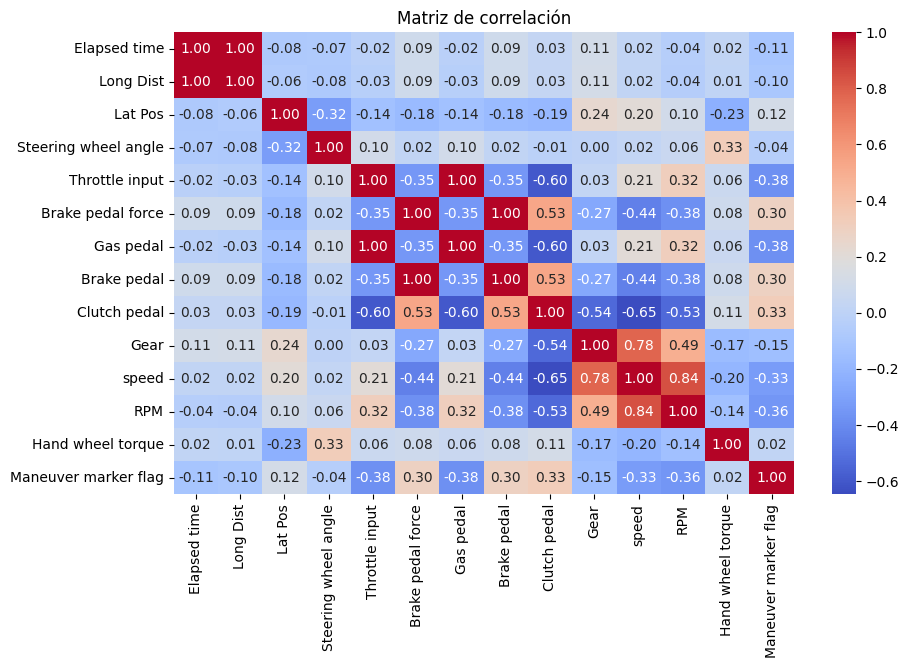

In [12]:
action = 'Stopping'

for i in range(1, 6):
    print(f'==========\nDriver{i}\n==========')
    path = f'./data/Driver{i}/STISIMData_{action}.csv'
    df = preprocess_data(path)
    
    # Seleccionar columnas relevantes para análisis temporal
    time_col = 'Elapsed time'
    value_cols = ['speed', 'Throttle input', 'Brake pedal force']
    marker_col = 'Maneuver marker flag'
    
    plot_time_series(df, time_col, value_cols, marker_col, i, action)

## **5.4. Acción: Turnings**

Driver1


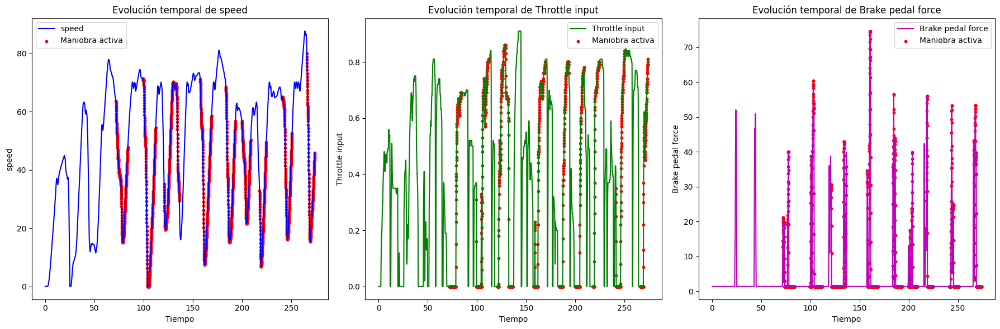

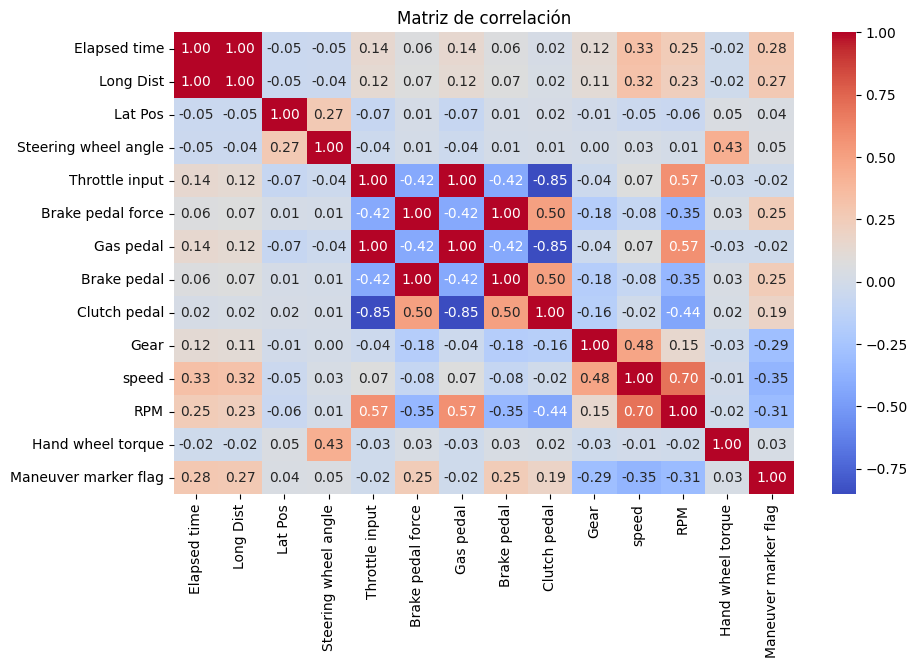

Driver2


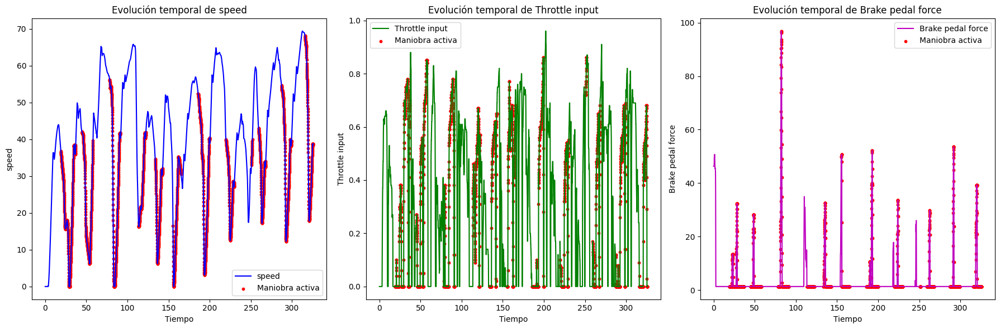

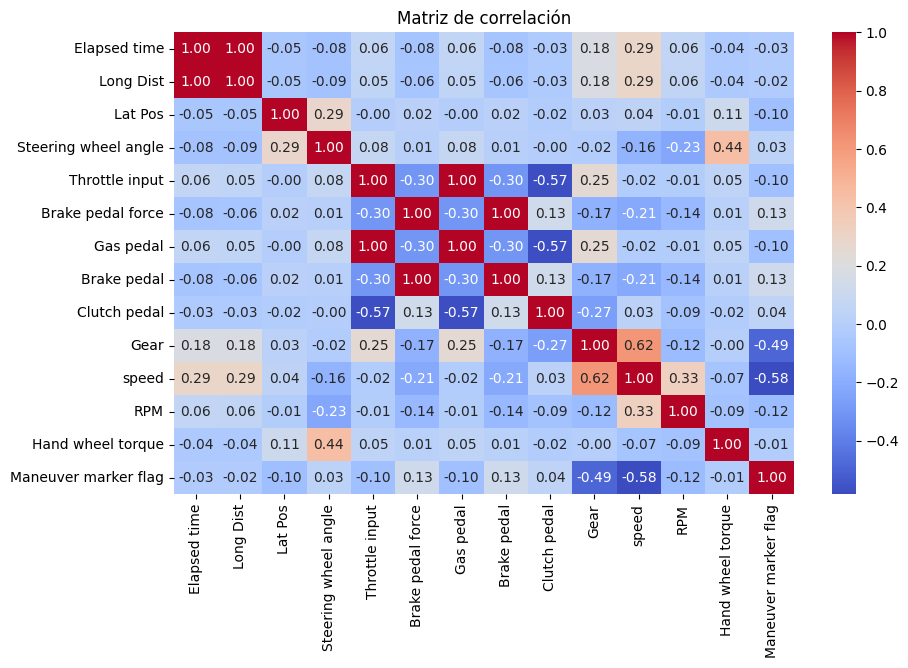

Driver3


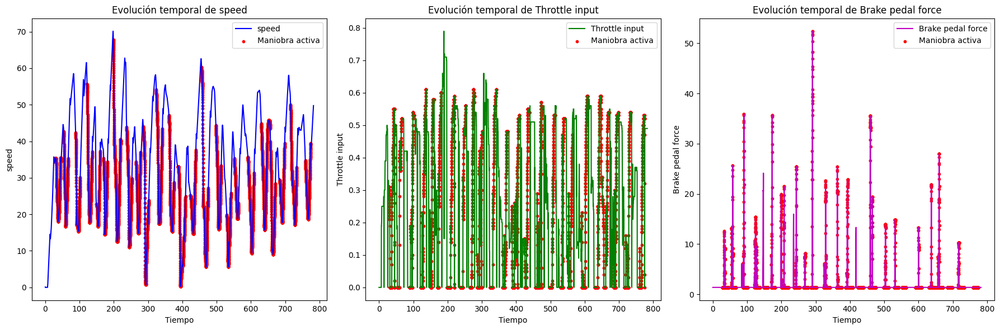

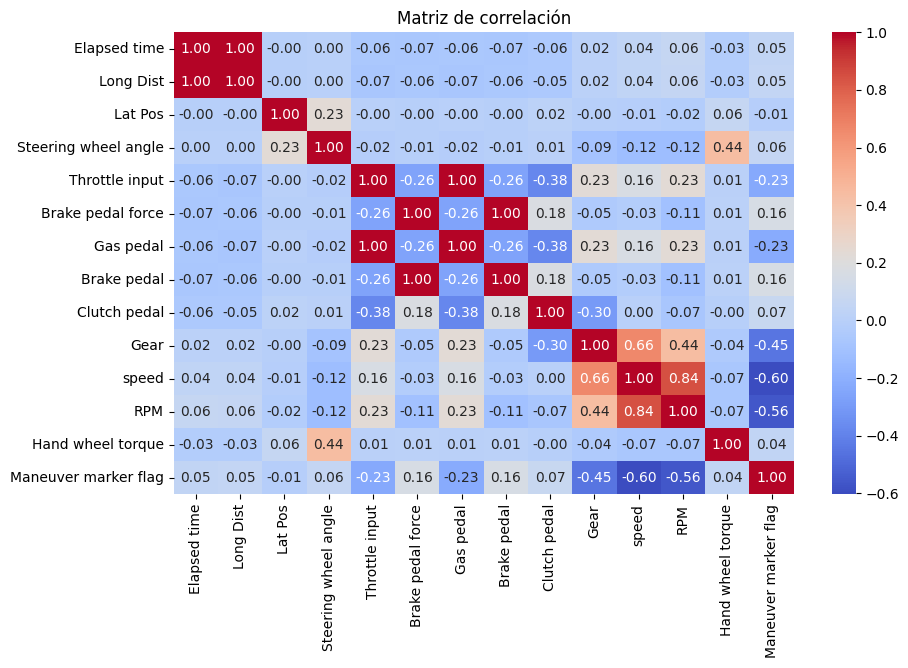

Driver4


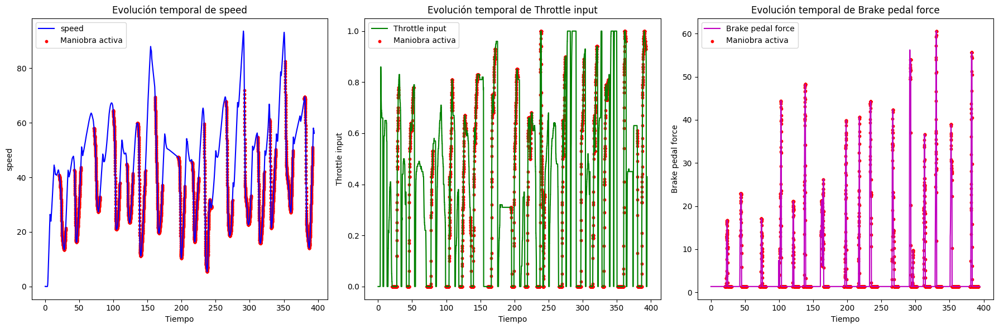

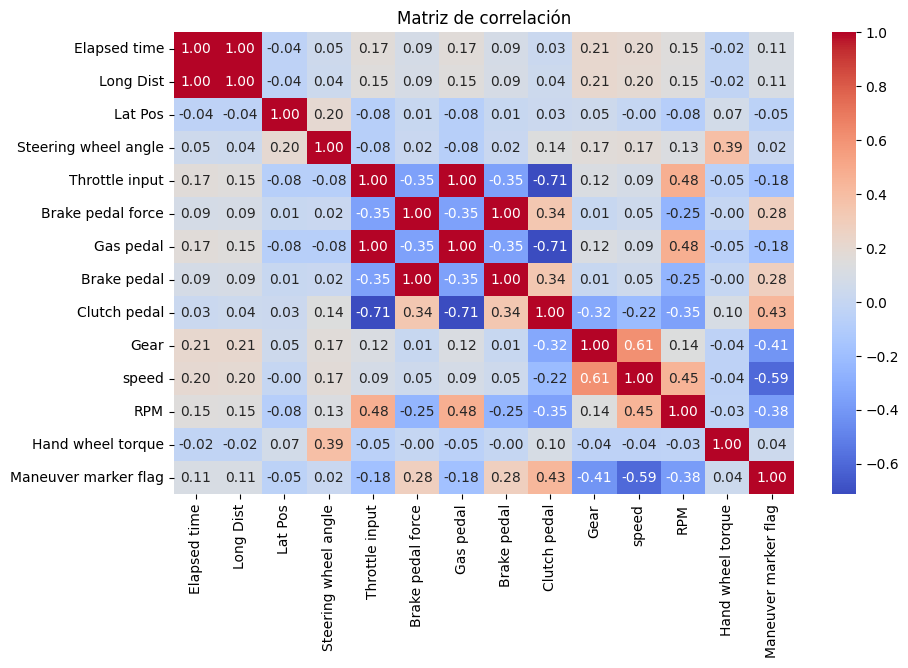

Driver5


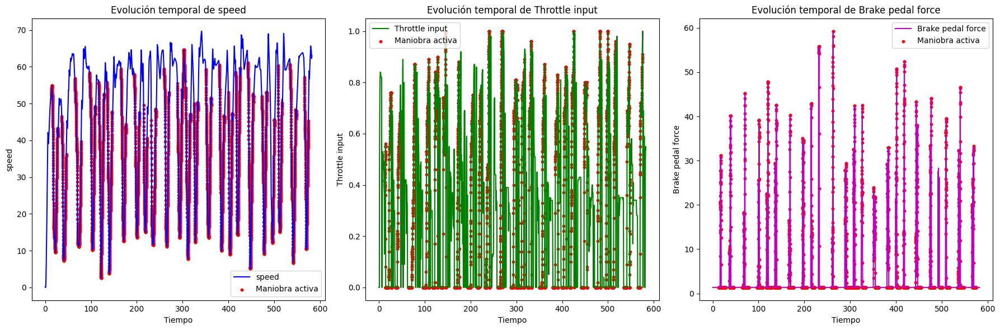

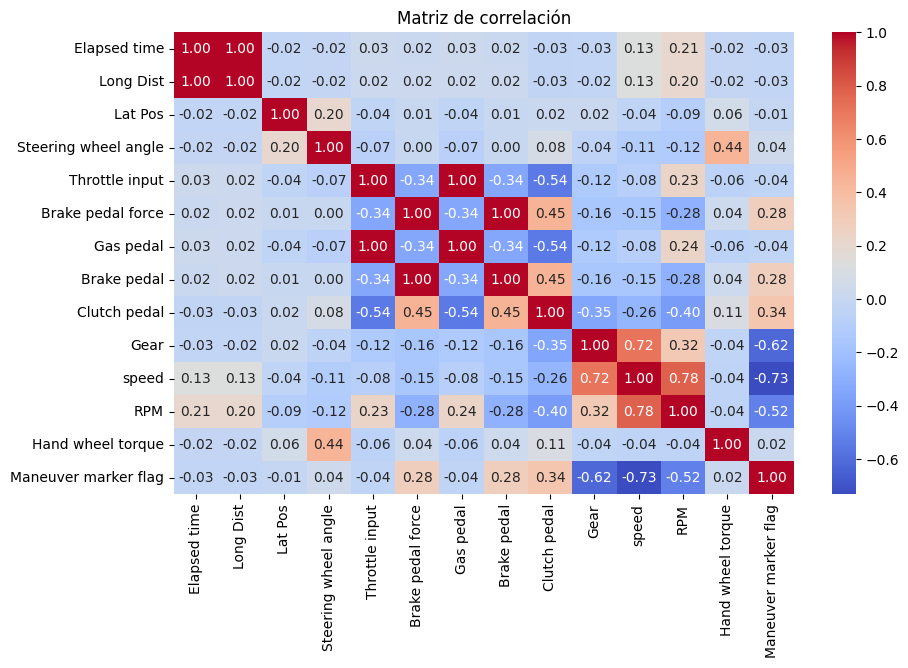

In [13]:
action = 'Turnings'

for i in range(1, 6):
    print(f'==========\nDriver{i}\n==========')
    path = f'./data/Driver{i}/STISIMData_{action}.csv'
    df = preprocess_data(path)
    
    # Seleccionar columnas relevantes para análisis temporal
    time_col = 'Elapsed time'
    value_cols = ['speed', 'Throttle input', 'Brake pedal force']
    marker_col = 'Maneuver marker flag'
    
    plot_time_series(df, time_col, value_cols, marker_col, i, action)

## **5.5. Acción: U-Turnings**

Driver1


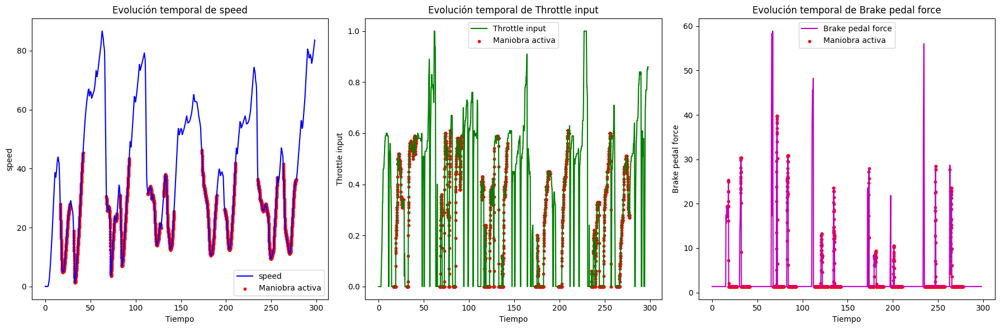

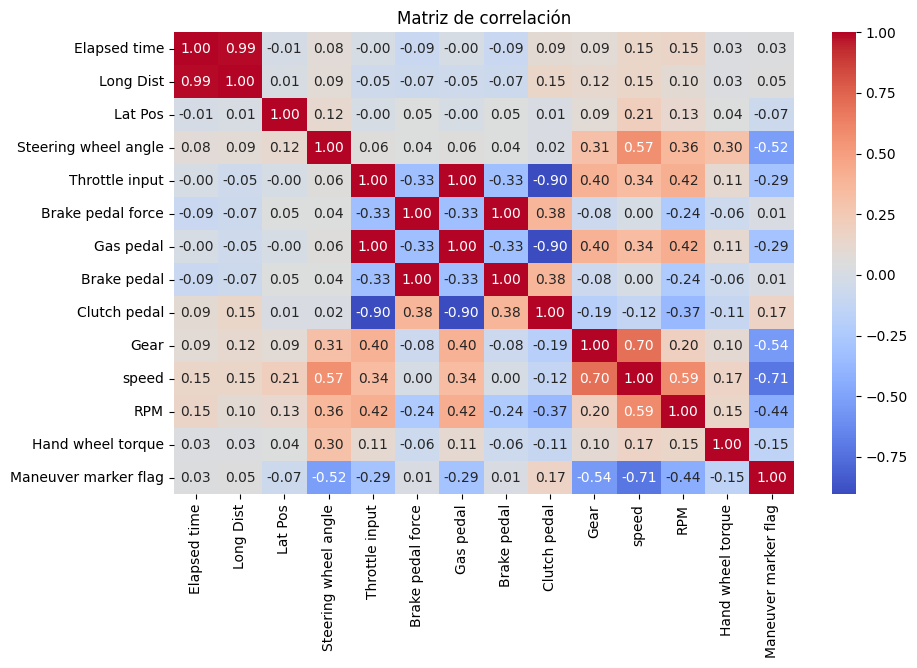

Driver2


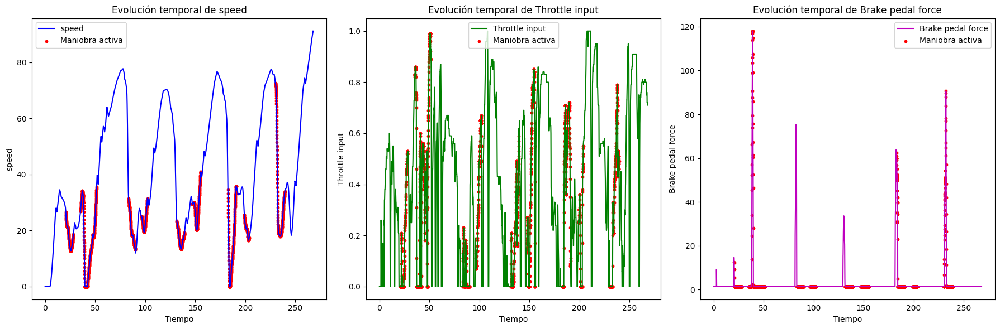

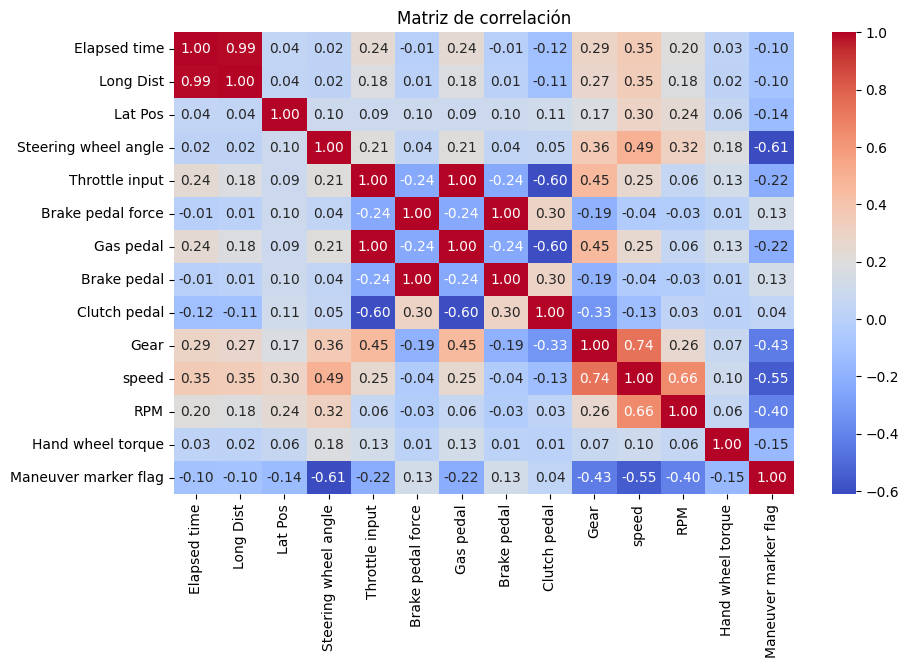

Driver3


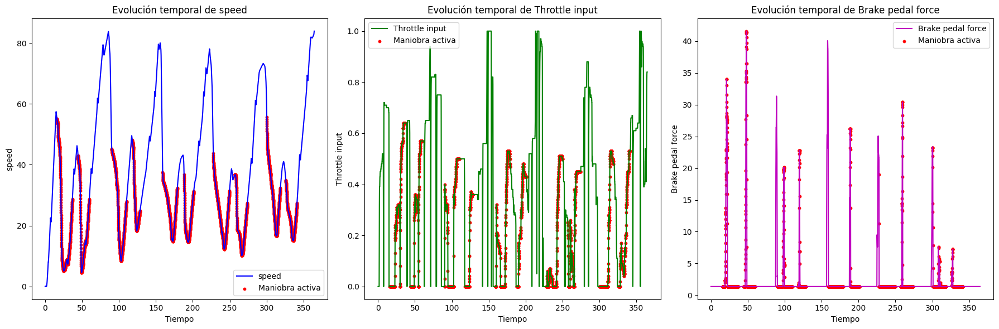

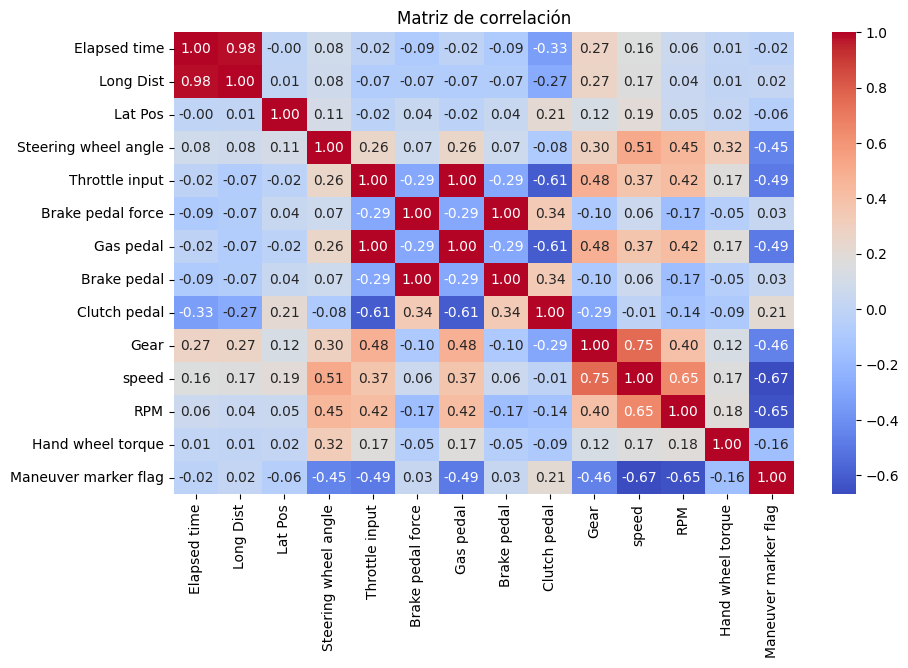

Driver4


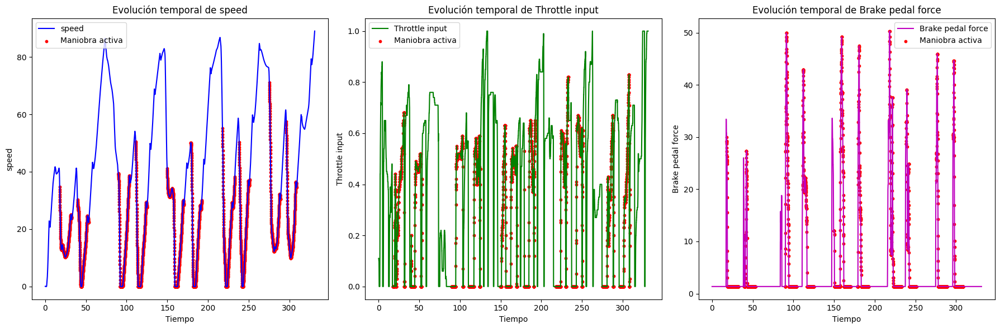

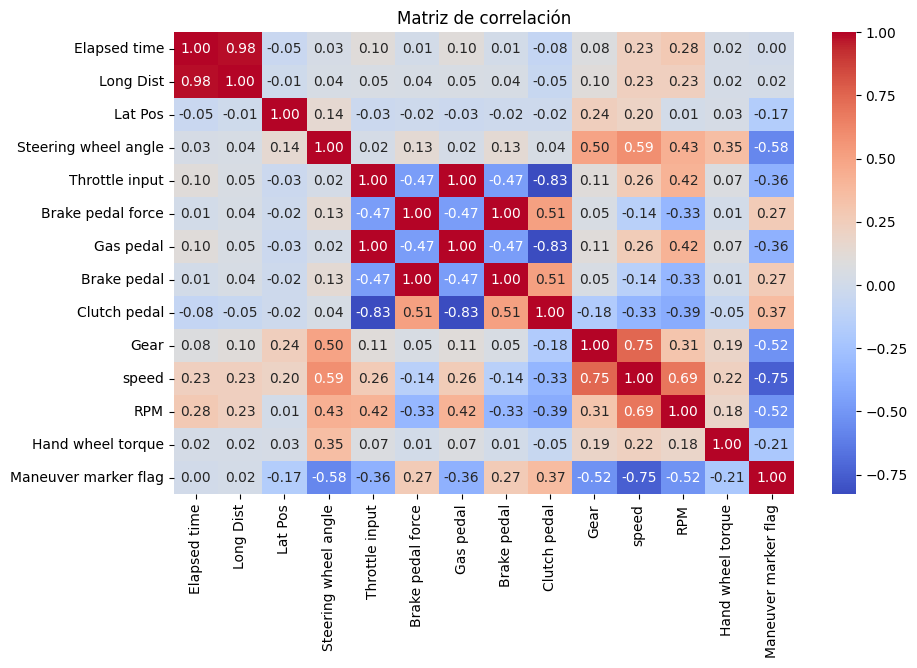

Driver5


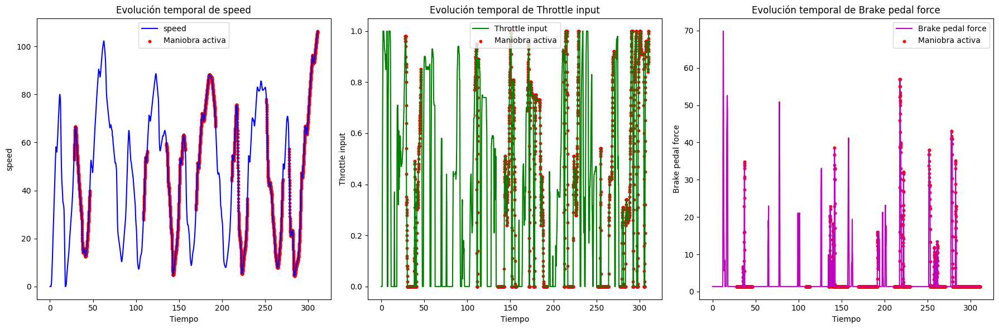

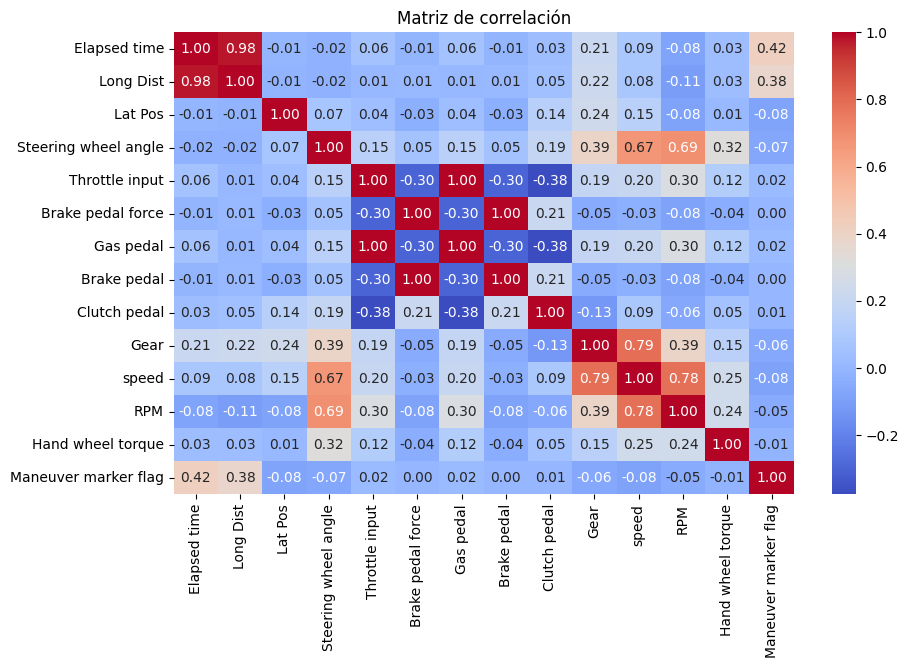

In [14]:
action = 'U-Turnings'

for i in range(1, 6):
    print(f'==========\nDriver{i}\n==========')
    path = f'./data/Driver{i}/STISIMData_{action}.csv'
    df = preprocess_data(path)
    
    # Seleccionar columnas relevantes para análisis temporal
    time_col = 'Elapsed time'
    value_cols = ['speed', 'Throttle input', 'Brake pedal force']
    marker_col = 'Maneuver marker flag'
    
    plot_time_series(df, time_col, value_cols, marker_col, i, action)

# **6. Creación del Modelo**

Utilizar un tipo de IA o dos (dos consume más tiempo lo único) e intentar ver el modelo para el máximo de acciones (si es posible las 5 mejor)

# **7. Validación y Verificación del Modelo**

Validación a través del uso de los conductores no utilizados y coger tanto pruebas en las que maneveur flag es 1 y es 0 (2/3 casos de 0 y 1 por cada acción, no?)

# **8. Análisis de los resultados**

Análisis de los resultados obtenidos en el análisis de pruebas (Validación y Verificación) del modelo y comparación con las métricas evaluadas para el entrenamiento del modelo. Explicar si efectivamente es capaz de predecir con resultados o no y su motivo!!!

# **9. Conclusiones**

Conclusiones finales sobre las acciones atómicas obtenidas y del propio modelo.

# **Referencias**

referencias en IEEE, [usar un fichero bibtex para todo más automático?]